# Trajectory tracking with PID control

In [1]:
import gym,warnings
# Remove anoying warning messages
warnings.filterwarnings("ignore") 
gym.logger.set_level(40)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from lgrp_class import lgrp_class # Gaussian random path
from custom_ant import AntEnvCustom # Custom Ant
from util import PID_class,display_frames_as_gif,quaternion_to_euler_angle
print ("Packages loaded.")

Packages loaded.


### Initialize env

In [2]:
env = AntEnvCustom()
obs_dim,act_dim,dT = env.observation_space.shape[0],env.action_space.shape[0],env.dt
obs,reward,done,_ = env.step(np.zeros(act_dim))
# Set PID controller (Kp=0.02,Ki=0.00001,Kd=0.001,windup=10000)
PID = PID_class(Kp=0.01,Ki=0.0001,Kd=0.002,windup=5000,sample_time=dT,dim=8)
# GRP parameters 
tMin,tMax,dim,nData = 0,3,act_dim,2
nTest = (int)((tMax-tMin)/dT)
tData = np.linspace(start=tMin,stop=tMax,num=nData).reshape((-1,1))
xData = np.random.rand(nData,dim) # Random positions 
lData = np.ones(shape=(nData,1))
lData[1:nData-1] = 0.5
tTest = np.linspace(start=tMin,stop=tMax,num=nTest).reshape((-1,1))
lTest = np.ones(shape=(nTest,1)) 
hyp = {'gain':1/4,'len':1/3,'noise':1e-8} # {'gain':1/4,'len':1/3,'noise':1e-8}
G = lgrp_class(_name='LGRP',_tData=tData,_xData=xData,_lData=lData,
               _tTest=tTest,_lTest=lTest,_hyp=hyp)
print ("Ant initialized. obs_dim:[%d] act_dim:[%d] dt:[%.3fsec]"
       %(obs_dim,act_dim,env.dt))

Custom Ant Environment made by SJ.
Ant initialized. obs_dim:[111] act_dim:[8] dt:[0.050sec]


### Track sampled trajectory

In [3]:
# Sample path 
sampledPaths = G.sample_paths(_nPath=1)
sampledPath = sampledPaths[0]
lenPath = sampledPath.shape[0]
scaledSampledPath = env.minPosDeg+(env.maxPosDeg-env.minPosDeg)*sampledPath
cntRepeat = 0
maxRepeat = 5 # Number of repeat
# Reset
obs = env.reset(); PID.clear()
for i in range(10): 
    sec = env.sim.data.time
    refPosDeg = scaledSampledPath[0,:]
    cPosDeg = np.asarray(obs[5:13])*180.0/np.pi # Current pos
    degDiff = cPosDeg-refPosDeg
    PID.update(degDiff,sec)
    action = PID.output
    actionRsh = action[[6,7,0,1,2,3,4,5]] # rearrange
    obs,_,_,_ = env.step(actionRsh)
PID.clear() # Reset PID after burn-in
env.sim.data.time = 0
tick,frames,titleStrs = 0,[],[]
tickPursuit = 0
timeList = np.zeros(shape=(lenPath*maxRepeat)) # 
cPosDegList = np.zeros(shape=(lenPath*maxRepeat,act_dim)) # Current joint trajectory
rPosDegList = np.zeros(shape=(lenPath*maxRepeat,act_dim)) # Reference joint trajectory
rewardSum = 0
xInit = env.get_body_com("torso")[0]
hInit = env.get_heading()
while cntRepeat < maxRepeat:
    # Some info
    sec = env.sim.data.time # Current time 
    x = env.get_body_com("torso")[0]
    q = env.data.get_body_xquat('torso')
    rX,rY,rZ = quaternion_to_euler_angle(q[0],q[1],q[2],q[3])
    
    # Render 
    frame = env.render(mode='rgb_array',width=200,height=200)
    frames.append(frame) # Append to frames for futher animating 
    titleStrs.append('%.2fsec x:[%.2f] heading:[%.1f]'%(sec,x,rZ))
    
    # PID controller 
    timeList[tick] = sec
    refPosDeg = scaledSampledPath[min(tickPursuit,lenPath-1),:]
    rPosDegList[tick,:] = refPosDeg
    cPosDeg = np.asarray(obs[5:13])*180.0/np.pi # Current pos
    cPosDegList[tick,:] = cPosDeg
    degDiff = cPosDeg-refPosDeg
    PID.update(degDiff,sec)
    
    # Do action 
    action = PID.output
    actionRsh = action[[6,7,0,1,2,3,4,5]] # rearrange
    obs,reward,done,rwdDetal = env.step(actionRsh.astype(np.float16))
    rewardSum += reward
    
    # Print out
    DO_PRINT = False
    if DO_PRINT:
        print ('sec: [%.2f] done: %s'%(sec,done))
        print (' cPosDeg:   %s'%(np.array2string(cPosDeg,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))
        print (' refPosDeg: %s'%(np.array2string(refPosDeg,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))           
        print (' degDiff:   %s'%(np.array2string(degDiff,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))
        print (' action:    %s'%(np.array2string(action,precision=2,
            formatter={'float_kind':lambda x: "%.2f" % x},
            separator=', ',suppress_small=False,sign=' ')))
        print (' reward:    %.3f (fwd:%.3f+ctrl:%.3f+contact:%.3f+survive:%.3f)'
            %(reward,rwdDetal['reward_forward'],rwdDetal['reward_ctrl'],
              rwdDetal['reward_contact'],rwdDetal['reward_survive']))
        
    # Increase tick 
    tick += 1
    tickPursuit += 1
    # Loop handler
    if tickPursuit >= lenPath:
        cntRepeat += 1
        tickPursuit = 0
xFinal = env.get_body_com("torso")[0]
hFinal = env.get_heading()
xDisp = xFinal - xInit
hDisp = hFinal - hInit
print ("Repeat:[%d] done. Avg reward is [%.3f]. xDisp is [%.3f]. hDisp is [%.3f]."
       %(maxRepeat,rewardSum/tick,xDisp,hDisp))

Creating window glfw
Done. Avg reward is [0.853]. xDisp is [-0.996]. hDisp is [59.722].


### Plot reference and joint trajectories

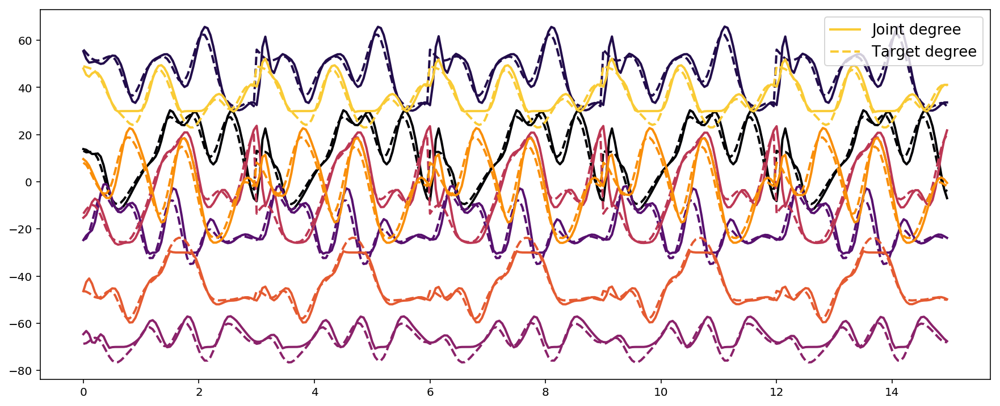

In [4]:
dim = cPosDegList.shape[1]
cmap = plt.get_cmap('inferno')
colors = [cmap(i) for i in np.linspace(0,1,dim+1)]
plt.figure(figsize=(15,6))
for dIdx in range(dim):
    hPos,=plt.plot(timeList,cPosDegList[:,dIdx],linestyle='-',color=colors[dIdx],lw=2)
    hTrg,=plt.plot(timeList,rPosDegList[:,dIdx],linestyle='--',color=colors[dIdx],lw=2)
plt.legend([hPos,hTrg],['Joint degree','Target degree'],fontsize=13)
plt.show()

### Animate

Making [300]-length gif ...



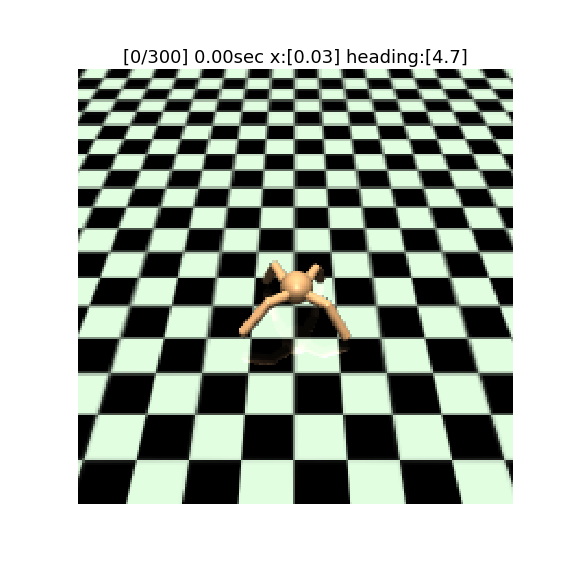
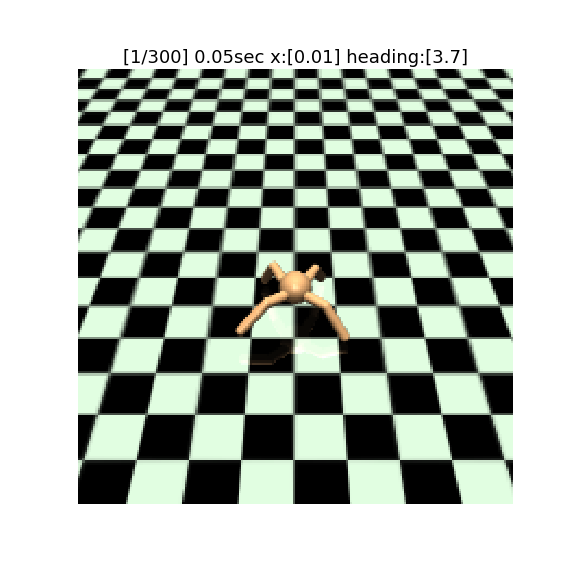
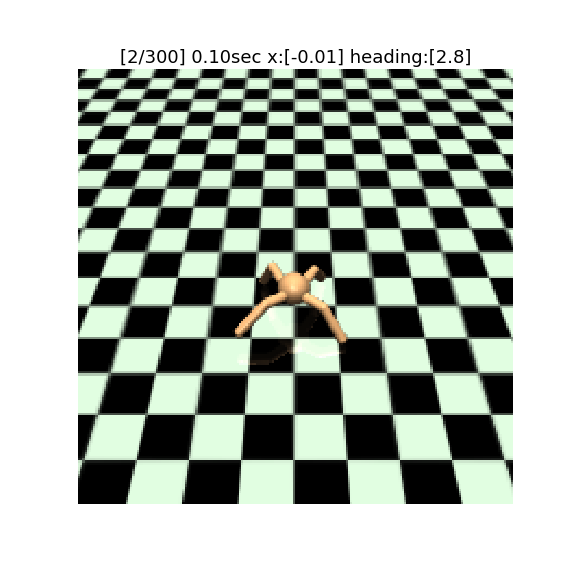
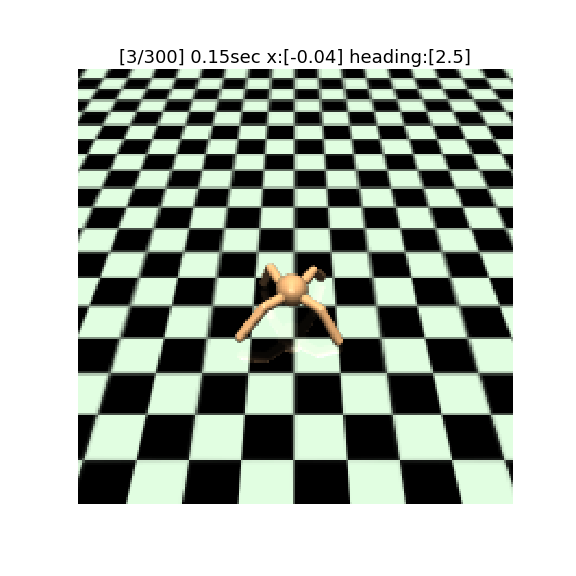
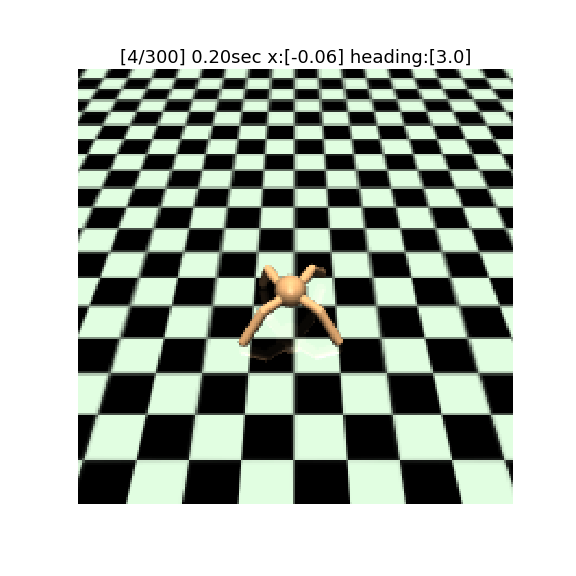
...
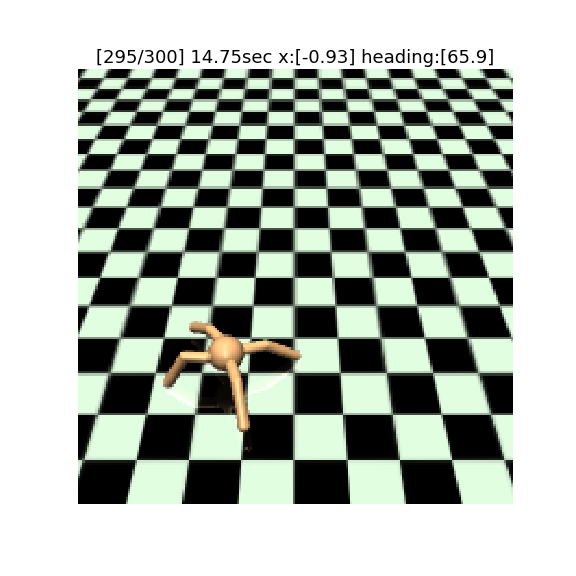
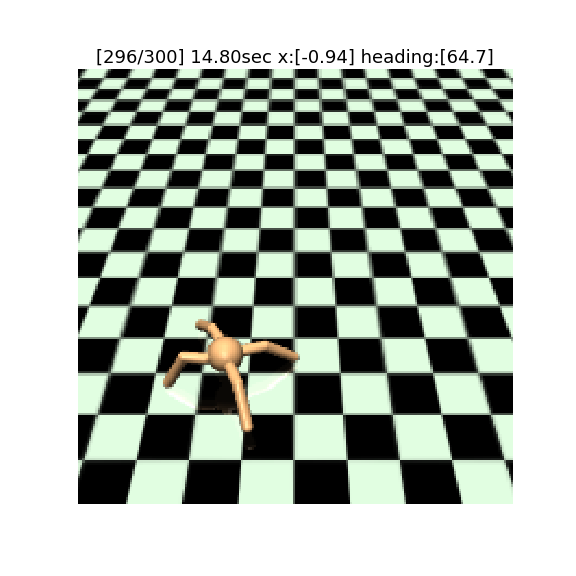
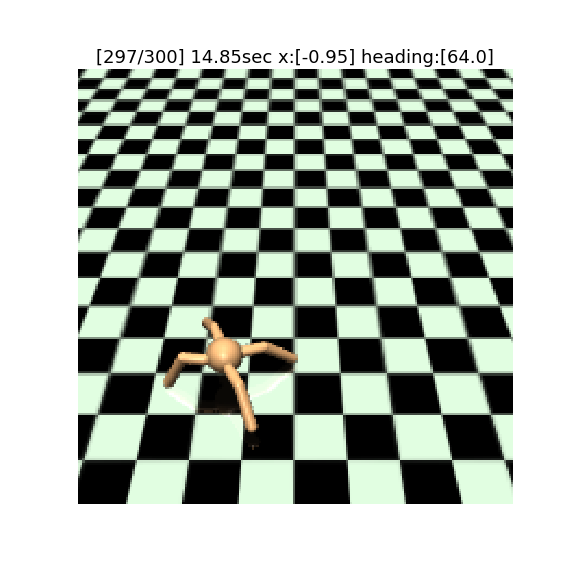
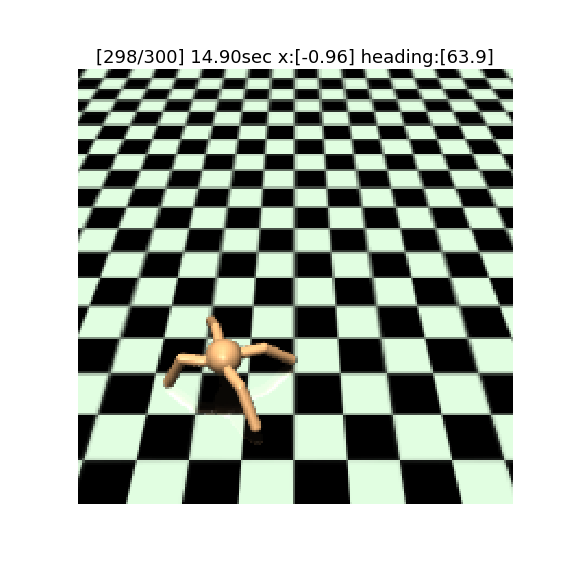
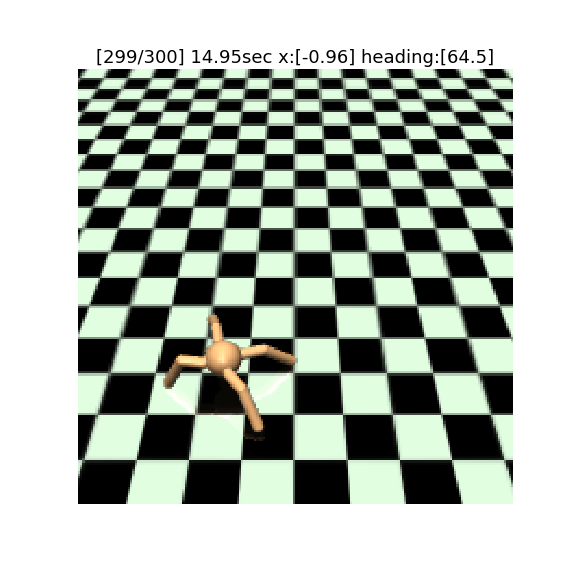

In [5]:
print ("Making [%d]-length gif ..."%(len(frames)))
display_frames_as_gif(frames,_intv_ms=20,_figsize=(8,8),_fontsize=18,_titleStrs=titleStrs)